<h1><center> Colorful Images Generation using Cartoon Sketch. </center></h1>

# 1. Problem

### 1.1. Description
- "sketch" of cartoon images of various characters from cartoon web_series is given with its source image i.e. colorful image.

### 1.2. Task
- The task is to output the colorful cartoon images given sketch image of that cartoon.

# 2. Machine Learning Problem

### 2.1. Type of ML Problem
- The problem is related with Images, So Deep Learning is used to solve the problem
- We have to generate the colorful image from sketch, the Probem is of GAN (Generative Adverserial Network)
- The problem is different from Vanilla GAN, here we have to generate images according to the sketch provided, SO the problem is related with Conditional GAN.

### 2.2. Data
- Source :- https://www.kaggle.com/wuhecong/danbooru-sketch-pair-128x
- Data is provided in one folder,which contains many folder inside.
- No separate data for test is provided.

# 3. Data Analysis

In [1]:
#Importing all necessary library
import os
import matplotlib.pyplot as plt
import cv2
import numpy as np
import shutil
import random
from tqdm import tqdm

### 3.1 Data Information

- There is total of approx 10 GB data.
- folder named "danbooru-sketch-pair-128x" contains two folder "color", "gray"
- folder named "gray" contains 1 GB of b/w cartoon which is nothing of use for us, so I removed it manually
- content of folder named "color" is copied under "danbooru-sketch-pair-128x" and color folder is removed manually

In [2]:
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [3]:
# after unzipping we get a folder named "danbooru-sketch-pair-128x" 
data_path = '/content/drive/MyDrive/CSE-803-Project/P/'
path = data_path+"danbooru-sketch-pair-128x/"
os.listdir(path)

['color']

- we have two Directory
        - "color" : contains the sketch-color pair where target image is color.
        - "gray" : contains the sketch-color pair where target image is gray shades.
        - we remove folder "gray" as it is of no use for us.

In [4]:
# checking folders inside "color" directory
path = path + "color"
os.listdir(path)

['src', 'sketch', 'train_set', 'test_set']

- we have two Directory
        - "sketch" : contains the sketch image. 
        - "src" : contains the colorful image of the corresponding sketch image.

In [5]:
def print_folder(directory):
    """
    This function print the total folder in given Directory
    """
    print(os.listdir(path+"/"+directory))
    print()
    print('Total Folder in "sketch" directory', len(os.listdir(path+"/sketch")))
    
print_folder("sketch")
print_folder("src")

['0002', '0001', '0000']

Total Folder in "sketch" directory 3
['0000', '0002', '0001']

Total Folder in "sketch" directory 3


##### observation:
- Both Directory contains same folders with same name.
- Lets check the total data-points in the "sketch" and "src" directory

In [ ]:
def count_instances(directory):
    """
        This Function count total number of data points in each directory, and print
        a data distribution plot for each folder in given directory
    """
    count = dict()
    total = 0
    for d in os.listdir(path+"/"+directory):
        count[d] = len(os.listdir(path+"/"+directory+"/"+d))
        total += len(os.listdir(path+"/"+directory+"/"+d))
    
    plt.figure(figsize=(25,4))
    plt.bar(*zip(*count.items()))
    plt.title("Distribution of data in {} directory".format(directory))
    plt.xlabel("Folder name")
    plt.ylabel("Count of files in folder")
    plt.show()
    print("Total instance in {} directory is: {}".format(directory,total))

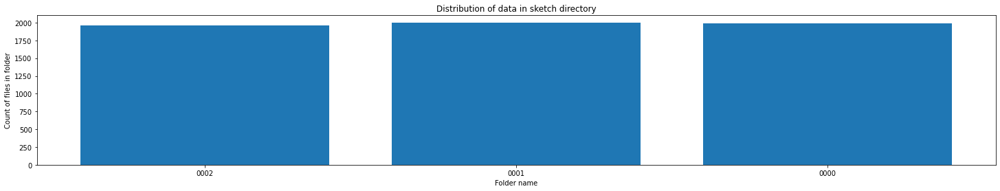

Total instance in sketch directory is: 5944


In [ ]:
# for "sketch" Directory
count_instances("sketch")

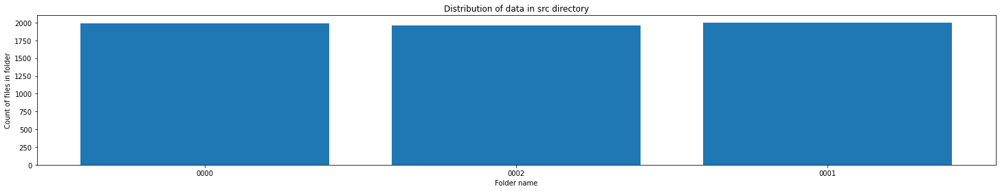

Total instance in src directory is: 5944


In [ ]:
# for "src" Directory
count_instances("src")

###### Observation: 
- The data distribution is same in both directory
- Total instance is same in both directory

## 3.2 Checking the names of all images from different directory

In [ ]:
image_name = list()
for d in os.listdir(path + "/sketch"):
    for img_name in os.listdir(path + "/sketch/"+d):
        image_name.append(img_name)

In [ ]:
print("Length of list of unique names",len(set(image_name)))
print("Length of list of names",len(image_name))

Length of list of unique names 5944
Length of list of names 5944


### Observation
- all names are unique
- As there is no class labels for these images, We can merge all images from different folders

#### Lets Observe one data point from both "Sketch" directory and "src" directory 

In [ ]:
def one_instance(directory):
    """
        this function shows one data from one of the folder
        from given directory
    """
    for d in os.listdir(path+"/"+directory):
        for file in os.listdir(path+"/"+directory+"/"+d):
            print("File Name is: ",file)
            if directory == 'sketch':
                img = cv2.imread(path+"/"+directory+"/"+d+"/"+file)
            else:
                img = cv2.imread(path+"/"+directory+"/"+d+"/"+file)
            plt.imshow(img[:,:,::-1])
            plt.show()
            print("Shape of image '{}' is: {}".format(file, img.shape))
            return
        

File Name is:  2125002.png


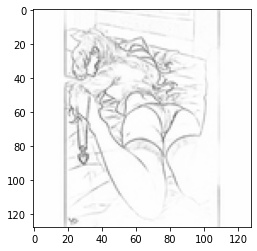

Shape of image '2125002.png' is: (128, 128, 3)


In [ ]:
one_instance("sketch")

File Name is:  2212000.png


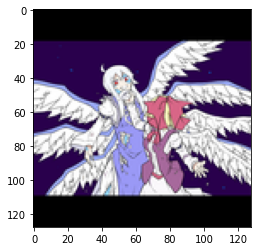

Shape of image '2212000.png' is: (128, 128, 3)


In [ ]:
one_instance("src")

### Observation
- We have approx 3 Lakh pairs of sketch-color images in each "sketch" and "src" directory.
- Data size is approx 9GB

## 4. Sampling and Creating train, validation and test data

- we will use approx 100K data for training, and randomly sample 5K data for testing purpose

- lets create a dictionary which have key as folder_name and value as a list which contains names of all image present in that folder 

In [ ]:
folder_dict = dict()
for d in os.listdir(path+"/sketch"):
    folder_dict[d] = [img_name for img_name in os.listdir(path+"/sketch/"+d)]

- we will take 700 images from each folder we have total (700 * 151) = 105700

In [ ]:
sample_train = dict()
for key, val in folder_dict.items():
    index = random.sample(range(0, len(val)), 1900)
    sample_train[key] = [val[i] for i in index]

In [ ]:
path

'/content/drive/MyDrive/CSE-803-Project/P/danbooru-sketch-pair-128x/color'

In [ ]:
def split_data(sample_dict,src,directory,dst):
    '''
        This function take a dictionary,directory name, source directory, destination_directory
        and copy its file from source to destination according to the data present in the dictionary. 
    '''
    for folder, image in sample_dict.items():
        source = '{}/{}/{}/'.format(src,directory, folder)
        destination = path+'/{}/{}/'.format(dst,directory)

        # we will check if the folder exists or not
        if not os.path.isdir(destination):
            os.makedirs(destination)
        for img in image:
            shutil.move(source+img,destination)

In [ ]:
# moving 700 images from each folder of sketch directory to train_set
split_data(sample_train,path,"sketch","train_set")

In [ ]:
# moving 700 images from each folder of src directory to train_set
split_data(sample_train,path,"src","train_set")

In [ ]:
def split_train_data(sample_dict,src,directory,dst):
    '''
        This function take a dictionary,directory name, source directory, destination_directory
        and copy its file from source to destination according to the data present in the dictionary. 
    '''
    for _ , image in sample_dict.items():
        source = '{}/{}/'.format(src,directory)
        destination = path+'/{}/{}/'.format(dst,directory)

        # we will check if the folder exists or not
        if not os.path.isdir(destination):
            os.makedirs(destination)
        for img in image:
            shutil.copy(source+img,destination)

In [ ]:
# sampling 40 images from each folder of train_set directory to test_set
sample_test = dict()
for key, val in sample_train.items():
    index = random.sample(range(0, 1900), 100)
    sample_test[key] = [val[i] for i in index]

In [ ]:
path

'/content/drive/MyDrive/CSE-803-Project/P/danbooru-sketch-pair-128x/color'

In [ ]:
# moving 40 images from each folder of sketch directory to test_set
split_train_data(sample_test,path+"/train_set","sketch","test_set")

In [ ]:
# moving 40 images from each folder of src directory to test_set
split_train_data(sample_test,path+"/train_set","src","test_set")

- __Note :- run all above section only one time.__

# 5. Applying Conditional GANs

In [5]:
!pip install -U protobuf==3.8.0

In [8]:
# importing library
import os
import matplotlib.pyplot as plt
import numpy as np
import shutil
import random
from IPython import display
import math

import tensorflow.keras.backend as K
import tensorflow as tf
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.initializers import RandomNormal
from tensorflow.keras.models import Model
from tensorflow.keras import Input
from tensorflow.keras.callbacks import TensorBoard
from tensorflow.keras.layers import Conv2D,Dropout,Conv2DTranspose,BatchNormalization,LeakyReLU,Concatenate,Activation,Dense
from tensorflow.keras.layers import Reshape, GlobalAveragePooling2D, ReLU
from tensorflow.keras.models import load_model
from PIL import ImageFile,Image
ImageFile.LOAD_TRUNCATED_IMAGES = True

from datetime import datetime
import glob

#setting GPU Configuration
config = tf.compat.v1.ConfigProto
# config.gpu_options.allow_growth = True
# config.gpu_options.per_process_gpu_memory_fraction = .25

# providing a same seed to all random generators
random_seed = 100

np.random.seed(random_seed)
random.seed(random_seed)
tf.random.set_seed(random_seed)

### 5.1. Defining Discriminator 

- we are trying to implement architecture mentioned in the research paper
- Image-to-Image Translation with Conditional Adversarial Networks, 2016.:- https://arxiv.org/pdf/1611.07004.pdf (check 6.0 Appendix)

- Effective Recpetive Field: It is the cross-section of Input Image which is seen by each output of last convolution layer. 
- In research paper they are using (256x256x3) images and they found that (70x70) effective receptive field is working good
- We will also use (70x70) effective receptive field.

- We have to back treverse to find the effective receptive field of a CNN model.
- formula is:- 
        - receptive field = (output_size - 1) * stride_size + kernel_size

In [9]:
def discriminator(img_shape):
    '''
    This function takes the shape of image as input and returns the discriminator as PatchGAN.
    '''
    
    # source image 
    source_image = Input(shape=img_shape)
    # target image
    target_image = Input(shape=img_shape)
    
    # defining kernel_initializer
    k_in = RandomNormal(stddev=0.02)
    
    # concatenating images
    con = Concatenate()([source_image, target_image])
    
    dis = Conv2D(64, (4,4), strides=(2,2), padding='same', kernel_initializer=k_in)(con) #64x64x64
    dis = LeakyReLU(alpha=0.2)(dis)   
    
    dis = Conv2D(128, (4,4), strides=(2,2), padding='same', kernel_initializer=k_in)(dis) #32x32x128
    dis = BatchNormalization()(dis)
    dis = LeakyReLU(alpha=0.2)(dis)
   

    dis = Conv2D(256, (4,4), strides=(2,2), padding='same', kernel_initializer=k_in)(dis) #16x16x256
    dis = BatchNormalization()(dis)
    dis = LeakyReLU(alpha=0.2)(dis)
    
    
    # second last layer
    dis = Conv2D(512, (2,2), kernel_initializer=k_in)(dis) #15x15x512
    dis = BatchNormalization()(dis)
    dis = LeakyReLU(alpha=0.2)(dis)
    
    # last layer
    out = Conv2D(1, (2,2), activation = "sigmoid", padding='valid', kernel_initializer=k_in)(dis) #14x14x1
    
    final_out = GlobalAveragePooling2D()(out)
    
    # defining model
    model = Model([source_image, target_image], final_out)
    model.compile(loss='binary_crossentropy', optimizer=Adam(lr=0.0002, beta_1=0.5), loss_weights=[0.5])
    return model
              

# checking model
image_shape = (128,128,3)
model = discriminator(image_shape)

# summary
model.summary()

Model: "model"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_1 (InputLayer)           [(None, 128, 128, 3  0           []                               
                                )]                                                                
                                                                                                  
 input_2 (InputLayer)           [(None, 128, 128, 3  0           []                               
                                )]                                                                
                                                                                                  
 concatenate (Concatenate)      (None, 128, 128, 6)  0           ['input_1[0][0]',                
                                                                  'input_2[0][0]']            

/usr/local/lib/python3.7/dist-packages/keras/optimizer_v2/adam.py:105: UserWarning: The `lr` argument is deprecated, use `learning_rate` instead.
  super(Adam, self).__init__(name, **kwargs)


### 5.2. Defining Generator

- We will use U-net model inside the Generator net

- Architecture mentioned in the research paper
        - Encoder:- C64-C128-C256-C512-C512-C512-C512
        - Decoder:- CD512-CD1024-CD1024-C1024-C512-C256-C128
- They are using (256x256x3) image with stride of (2x2) in each layer which will reduce size to 1 in bottleneck
- But we have (128x128x3) so we will discard one layer from each endocer and decoder 

- we are using this architecture.

- Encoder:- C64-C128-C256-C512-C512-C512-C512
- Decoder:- CD512-CD1024-CD1024-C1024-C512-C256-C128

In [10]:
def generator(img_shape):
    
    '''
    This function takes the shape of image as input and returns the generator model as U-net architecture.
    '''
    
    k_in = RandomNormal(stddev=0.02)
    
    # image input
    sketch_img = Input(shape=img_shape)
    
    # encoder
    gen_en1 = Conv2D(64, (4,4), strides=(2,2), padding='same', kernel_initializer=k_in)(sketch_img)
    gen_en1 = LeakyReLU(alpha=0.2)(gen_en1)
    
    gen_en2 = Conv2D(128, (4,4), strides=(2,2), padding='same', kernel_initializer=k_in)(gen_en1)
    gen_en2 = BatchNormalization()(gen_en2, training=True)
    gen_en2 = LeakyReLU(alpha=0.2)(gen_en2)
    
    gen_en3 = Conv2D(256, (4,4), strides=(2,2), padding='same', kernel_initializer=k_in)(gen_en2)
    gen_en3 = BatchNormalization()(gen_en3, training=True)
    gen_en3 = LeakyReLU(alpha=0.2)(gen_en3)
    
    gen_en4 = Conv2D(512, (4,4), strides=(2,2), padding='same', kernel_initializer=k_in)(gen_en3)
    gen_en4 = BatchNormalization()(gen_en4, training=True)
    gen_en4 = LeakyReLU(alpha=0.2)(gen_en4)
    
    gen_en5 = Conv2D(512, (4,4), strides=(2,2), padding='same', kernel_initializer=k_in)(gen_en4)
    gen_en5 = BatchNormalization()(gen_en5, training=True)
    gen_en5 = LeakyReLU(alpha=0.2)(gen_en5)
    
    gen_en6 = Conv2D(512, (4,4), strides=(2,2), padding='same', kernel_initializer=k_in)(gen_en5)
    gen_en6 = BatchNormalization()(gen_en6, training=True)
    gen_en6 = LeakyReLU(alpha=0.2)(gen_en6)
    
    
    # bottleneck
    bttl = Conv2D(512, (4,4), strides=(2,2), padding='same',activation="relu", kernel_initializer=k_in)(gen_en6)
    
    # decoder
    gen_de1 = Conv2DTranspose(512, (4,4), strides=(2,2), padding='same', kernel_initializer=k_in)(bttl)
    gen_de1 = BatchNormalization()(gen_de1, training=True)
    gen_de1 = Dropout(0.5)(gen_de1, training=True)
    gen_de1 = Concatenate()([gen_de1, gen_en6])
    gen_de1 = Activation('relu')(gen_de1)
    
    gen_de2 = Conv2DTranspose(512, (4,4), strides=(2,2), padding='same', kernel_initializer=k_in)(gen_de1)
    gen_de2 = BatchNormalization()(gen_de2, training=True)
    gen_de2 = Dropout(0.5)(gen_de2, training=True)
    gen_de2 = Concatenate()([gen_de2, gen_en5])
    gen_de2 = Activation('relu')(gen_de2)
    
    gen_de3 = Conv2DTranspose(512, (4,4), strides=(2,2), padding='same', kernel_initializer=k_in)(gen_de2)
    gen_de3 = BatchNormalization()(gen_de3, training=True)
    gen_de3 = Dropout(0.5)(gen_de3, training=True)
    gen_de3 = Concatenate()([gen_de3, gen_en4])
    gen_de3 = Activation('relu')(gen_de3)
    
    gen_de4 = Conv2DTranspose(256, (4,4), strides=(2,2), padding='same', kernel_initializer=k_in)(gen_de3)
    gen_de4 = BatchNormalization()(gen_de4, training=True)
    gen_de4 = Concatenate()([gen_de4, gen_en3])
    gen_de4 = Activation('relu')(gen_de4)
    
    gen_de5 = Conv2DTranspose(128, (4,4), strides=(2,2), padding='same', kernel_initializer=k_in)(gen_de4)
    gen_de5 = BatchNormalization()(gen_de5, training=True)
    gen_de5 = Concatenate()([gen_de5, gen_en2])
    gen_de5 = Activation('relu')(gen_de5)
    
    gen_de6 = Conv2DTranspose(64, (4,4), strides=(2,2), padding='same', kernel_initializer=k_in)(gen_de5)
    gen_de6 = BatchNormalization()(gen_de6, training=True)
    gen_de6 = Concatenate()([gen_de6, gen_en1])
    gen_de6 = Activation('relu')(gen_de6)
    
    
    # output
    gen_col_img = Conv2DTranspose(3, (4,4), strides=(2,2), activation= 'tanh',padding='same', kernel_initializer=k_in)(gen_de6)
    
    # define model
    model = Model(sketch_img, gen_col_img)
    return model

# checking model
image_shape = (128,128,3)
model = generator(image_shape)

# summary
model.summary()

Model: "model_1"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_3 (InputLayer)           [(None, 128, 128, 3  0           []                               
                                )]                                                                
                                                                                                  
 conv2d_5 (Conv2D)              (None, 64, 64, 64)   3136        ['input_3[0][0]']                
                                                                                                  
 leaky_re_lu_4 (LeakyReLU)      (None, 64, 64, 64)   0           ['conv2d_5[0][0]']               
                                                                                                  
 conv2d_6 (Conv2D)              (None, 32, 32, 128)  131200      ['leaky_re_lu_4[0][0]']    

### 5.3. Defining Loss

In [11]:
from tensorflow.keras.applications.vgg16 import preprocess_input
from tensorflow.keras.applications.vgg16 import VGG16

vgg16 = VGG16(weights='imagenet')

553476096/553467096 [==============================] - 6s 0us/step


In [12]:
# Defining loss in model.complile keras; https://stackoverflow.com/a/45963039/9079093

# loss between feature map of target and generated image
def feature_loss(true, pred):
    '''
    parameter "true" is feature map of real color image,
    parameter "pred" is feature map of generated image, 
    it returns the euclidean distance between feature map 
    of real color image and generated image.
    '''
    def f_loss(y_true, y_pred):
        return K.mean( K.sqrt( K.sum( K.square( true - pred ))))
    return f_loss


# About variation loss https://www.tensorflow.org/api_docs/python/tf/image/total_variation
def variation_loss(pred):
    '''
    parameter "pred" is generated image, 
    it returns the square root of sum of differences between neighbouring pixels
    of geberated image
    '''
    def v_loss(y_pred):
        return K.sqrt(K.sum(K.square(pred[:, 1:, :, :] - pred[:, :-1, :, :]))\
                             + K.sum(K.square(pred [:, :, 1:, :] - pred [:, :, :-1, :])))
    return v_loss

# pixel wize loss between target and generated image
def pixel_loss(true, pred):
    '''
    parameter "true" is real color image, parameter "pred" is generated image,
    For each pixel of real color image and generated image it returns the average 
    of distance between them.
    '''
    
    def p_loss(y_true, y_pred):
        return K.mean( K.abs( true - pred ) )
    return p_loss


### 5.4. Defining GAN (Generative Adverserial Network)

In [13]:
# Extracting intermediate layer features keras : https://keras.io/applications/#vgg16

vgg_1 = Model(inputs=vgg16.input, outputs=ReLU()(vgg16.get_layer('block2_conv2').output))
vgg_2 = Model(inputs=vgg16.input, outputs=ReLU()(vgg16.get_layer('block2_conv2').output))

pixel_loss_weight = 100
variation_loss_weight = .0001
feature_loss_weight = .01

def define_gan(g_model, d_model, image_shape):
    
    '''
    Takes generator, discriminator model and image_shape as input, and returns the GAN model as output
    '''
    
    def gan_loss(y_true, y_pred):
        '''
        returns the loss function of GAN.
        '''
        return tf.keras.losses.binary_crossentropy(y_true, y_pred) + pixel_loss_weight * pixel_loss_out(y_true, y_pred) +\
               variation_loss_weight * variation_loss_out(y_pred) + feature_loss_weight * feature_loss_out(y_true, y_pred)

  
    d_model.trainable = False

    #Generator
    sketch_image = Input(image_shape)
    gen_output = g_model([sketch_image])

    #Discriminator
    dis_output = d_model([sketch_image, gen_output])
    
    #Pixel Loss
    color_image = Input(image_shape)
    pixel_loss_out = pixel_loss(color_image, gen_output)
  
    #Variation Loss
    variation_loss_out = variation_loss(gen_output)
    
    #Feature Loss
    vgg1_out = vgg_1([tf.image.resize(color_image, (128,128), tf.image.ResizeMethod.BILINEAR)])
    vgg2_out = vgg_2([tf.image.resize(gen_output, (128,128), tf.image.ResizeMethod.BILINEAR)])

    feature_loss_out = feature_loss(vgg1_out,vgg2_out)
  
    #Final Model
    model = Model(inputs=[sketch_image, color_image], outputs=dis_output)

    #Single output multiple loss functions in keras : https://stackoverflow.com/a/51705573/9079093

    model.compile(loss= gan_loss, optimizer= Adam(lr=0.0002, beta_1=0.5))
    
    return model


# checking the model
image_shape = (128,128,3)

g_model = generator(image_shape)

d_model = discriminator(image_shape)

gan_model = define_gan(g_model, d_model,image_shape)
gan_model.summary()

/usr/local/lib/python3.7/dist-packages/keras/optimizer_v2/adam.py:105: UserWarning: The `lr` argument is deprecated, use `learning_rate` instead.
  super(Adam, self).__init__(name, **kwargs)


Model: "model_6"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_8 (InputLayer)           [(None, 128, 128, 3  0           []                               
                                )]                                                                
                                                                                                  
 model_4 (Functional)           (None, 128, 128, 3)  41841283    ['input_8[0][0]']                
                                                                                                  
 input_9 (InputLayer)           [(None, 128, 128, 3  0           []                               
                                )]                                                                
                                                                                            

# 6. Loading Data From Directory
- we have all image with sahpe (128x128x3)

In [21]:
path

'/content/drive/MyDrive/CSE-803-Project/P/danbooru-sketch-pair-128x/color'

In [22]:
color_img_path = glob.glob(path+'/train_set/src/*.png')
sketch_path = glob.glob(path+'/train_set/sketch/*.png')

# color_img_path = glob.glob('test_set/src/*.png')
# sketch_path = glob.glob('test_set/sketch/*.png')

color_image_path = np.array(color_img_path)
sketch_path = np.array(sketch_path)

total_img = color_image_path.shape[0]
total_img

5700

In [23]:
def generate_real_images(sketch_path, color_image_path, n_sample):
    '''
    This function will read the data from paths provided and return the 
    actual sketch-color pair along with class label as "1" which denotes real images.
    '''
    
    index = np.random.randint(0, total_img, n_sample)
    sketch_image = []
    color_image = []
  
    for sketch, img in zip(sketch_path[index], color_image_path[index]):
        sketch_image.append(np.array(Image.open(sketch).convert('RGB')))
        color_image.append(np.array(Image.open(img).convert('RGB')))
  
    # Normalizing the values to be between [-1, 1].
    sketch_image = (np.array(sketch_image, dtype='float32')/127.5 - 1)
    color_image = (np.array(color_image, dtype='float32')/127.5 - 1)
    
    y_real = np.ones((n_sample,1))

    return sketch_image, color_image, y_real

def generate_fake_images(g_model, sketch_path, n_sample , seed_sketch=None, seed_color=None):
    '''
    This function will read only sketch data, and generate fake data using generator and return
    fake sketch-color pair along with class label as "0" which denotes fake images.
    '''
    
    sketch_image = []
    fake_color_image = []
    
    if seed_sketch is not None and seed_color is not None:
        fake_color_image = g_model.predict(seed_sketch)
        return seed_color, fake_color_image
    
    else:
        index = np.random.randint(0, total_img, n_sample)

        for sketch in sketch_path[index]:
            sketch_image.append(np.array(Image.open(sketch).convert('RGB')))
        
        # Normalizing the values to be between [-1, 1].
        sketch_image = (np.array(sketch_image, dtype='float32')/127.5 - 1)

        fake_color_image = g_model.predict(sketch_image)
        y_fake = np.zeros((n_sample, 1))

        return sketch_image, fake_color_image, y_fake
        
    

def summary_save_plot(epoch, g_model, sketch_path, seed_sketch, seed_color, n_sample=8):
    '''
    This Function will plot the real color image along with generated color image, and saves the plot
    '''

    real_color_image, fake_color_image = generate_fake_images(g_model, sketch_path, n_sample, seed_sketch=seed_sketch,\
                                                               seed_color=seed_color)

    row,col = 4,4
    
    gen_imgs = np.concatenate([fake_color_image, real_color_image])
    
    # Rescaling images to [0 - 1]
    gen_imgs = 0.5 * gen_imgs + 0.5

    titles = ['Generated','Generated','Original','Original']
    
    fig, axs = plt.subplots(row, col, figsize=(10,10))
    cnt = 0
    for i in range(row):
        for j in range(col):
            axs[i,j].imshow(gen_imgs[cnt])
            axs[i,j].set_title(titles[i])
            axs[i,j].axis('off')
            cnt += 1
    fig.savefig("test_result/{}.png".format(epoch))
    plt.show()
    plt.close()


def save_model(epoch,g_model):
    '''
        Saves the Generator Model
    '''
    # saving models after each epoch
    if not os.path.isdir('save_model/generator'):
        os.makedirs('save_model/generator')
        
    g_model.save('save_model/generator/generator_{}.h5'.format(epoch))

# 7. Defining Callbacks

In [24]:
# https://github.com/eriklindernoren/Keras-GAN/issues/52

def write_log(callback, name, loss, batch_no, flush=False):
    '''
        Defining manual callback
    '''
    summary = tf.Summary()
    summary_value = summary.value.add()
    summary_value.tag = name
    summary_value.simple_value = loss
    callback.writer.add_summary(summary, batch_no)
    
    if flush:
        callback.writer.flush()

In [25]:
#Generator Tensorboard
gen_callback = TensorBoard(log_dir="tensorbaord/generator/")
gen_callback.set_model(g_model)

#Discriminator Tensorboard
disc_callback = TensorBoard(log_dir="tensorbaord/discriminator/")
disc_callback.set_model(d_model)


# 8. Training

In [26]:
def train(g_model, d_model, gan_model, sketch_path, color_image_path, seed_sketch, seed_color, n_epoch, n_batch, initial_epoch):
    '''
    This function train the model over randomly sampled batch of real images 
    and fake images. Both discriminator and generator is trained alternatively.
    Results are displayed and generator model is saved after each epoch.
    '''
    batch_per_epoch = int(total_img / n_batch)
    half_batch = int(n_batch / 2) # this is created for discriminator as er are calling it twice so we pass half data.
  
    for i in range(initial_epoch, n_epoch):
        start2 = datetime.now()
        generator_loss = []
        discriminator_loss = []
    
        for j in range(batch_per_epoch):
            
            # discriminator model needs to be called twice
            if not j%2: # train only for odd value of j, to avoid over training
                
                # Discriminator real loss 
                real_sketch, real_col_image, y_real = generate_real_images(sketch_path, color_image_path, half_batch)
                d_loss_real = d_model.train_on_batch([real_sketch, real_col_image], y_real * .9)

            if not j%3: # train only when j is multiple of 3. to avoid over training
                
                # Discriminator fake loss 
                fake_sketch, fake_col_image, y_fake = generate_fake_images(g_model, sketch_path, half_batch)
                d_loss_fake = d_model.train_on_batch([fake_sketch, fake_col_image], y_fake)
                
            total_dis_loss = d_loss_real + d_loss_fake

            #GAN loss
            real_sketch, real_col_image, y_real = generate_real_images(sketch_path, color_image_path, n_batch)
            gan_loss = gan_model.train_on_batch([real_sketch, real_col_image], y_real)
            
            # saving loss per epoch
            discriminator_loss.append(total_dis_loss)
            generator_loss.append(gan_loss)

            
            # output after 100 iter
            if not j % 100:
                print("epoch>{}, {}/{}, d_real={:.3f}, d_fake={:.3f}, gan={:.3f}".format(i+1, j+1, batch_per_epoch,\
                                                                                         d_loss_real,d_loss_fake, gan_loss))

        # writing to tensorboard
        write_log(disc_callback, 'discriminator_loss', np.mean(discriminator_loss), i+1, (i+1)%3==0)
        write_log(gen_callback, 'generator_loss', np.mean(generator_loss), i+1, (i+1)%3==0)

        #Summary after every epoch.
        display.clear_output(True)
        print('Time for epoch {} : {}'.format(i+1, datetime.now()-start2))
        print('epoch>{}, {}/{}, d_real={:.3f}, d_fake={:.3f}, gan={:.3f}'.format(i+1, j+1, batch_per_epoch, d_loss_real,\
                                                                       d_loss_fake, gan_loss))
        summary_save_plot(i, g_model, sketch_path, seed_sketch,seed_color, seed_color.shape[0])
        
        # saving model
        save_model(i,g_model)
    
    # Final summary
    display.clear_output(True)
    print('epoch>{}, {}/{}, d_real={:.3f}, d_fake={:.3f}, gan={:.3f}'.format(i+1, j+1, batch_per_epoch, d_loss_real,\
                                                                             d_loss_fake, gan_loss))
    summary_save_plot(i, g_model, sketch_path, seed_sketch, seed_color, seed_color.shape[0])
    

In [28]:
# sampling data for the 
seed_sketch = []
seed_color = []
index = np.random.randint(0, total_img, 8)

for sketch, image in zip(sketch_path[index], color_image_path[index]):
    seed_sketch.append(np.array(Image.open(sketch).convert('RGB')))
    seed_color.append(np.array(Image.open(image).convert('RGB')))

#Normalizing the values to be between [-1, 1].
seed_sketch = (np.array(seed_sketch, dtype='float32')/127.5 - 1)
seed_color = (np.array(seed_color, dtype='float32')/127.5 - 1)

In [30]:
from tensorflow.python.framework.ops import disable_eager_execution

disable_eager_execution()

In [31]:
#Training
train(g_model, d_model, gan_model, sketch_path, color_image_path, seed_sketch, seed_color, n_epoch=40, n_batch=32, initial_epoch=0)

RuntimeError: ignored

epoch>40, 3114/3114, d_real=0.165, d_fake=0.004, gan=216.168


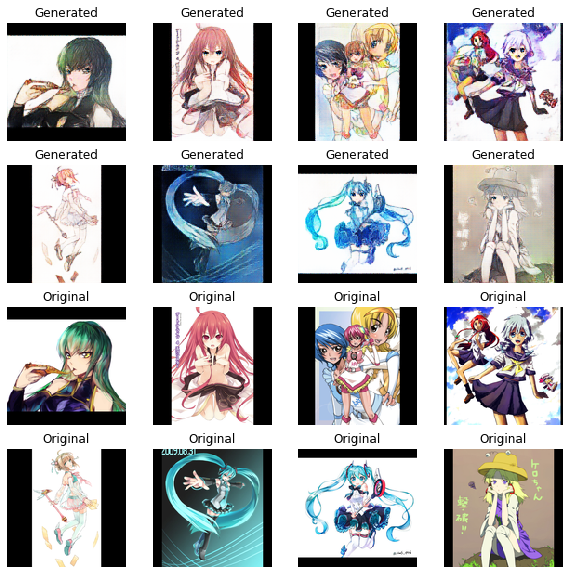

In [ ]:
#Training
train(g_model, d_model, gan_model, sketch_path, color_image_path, seed_sketch, seed_color, n_epoch=40, n_batch=32, initial_epoch=0)

epoch>50, 3114/3114, d_real=0.163, d_fake=0.008, gan=230.379


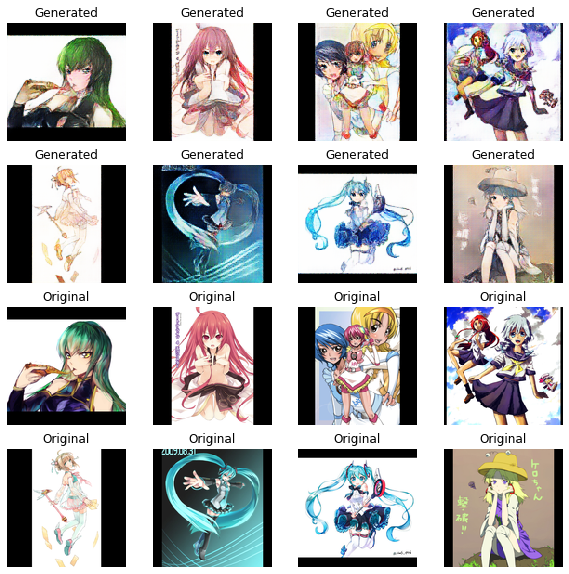

In [ ]:
#Training
train(g_model, d_model, gan_model, sketch_path, color_image_path, seed_sketch, seed_color, n_epoch=50, n_batch=32, initial_epoch=40)

## 8.1. Tensorboard Results

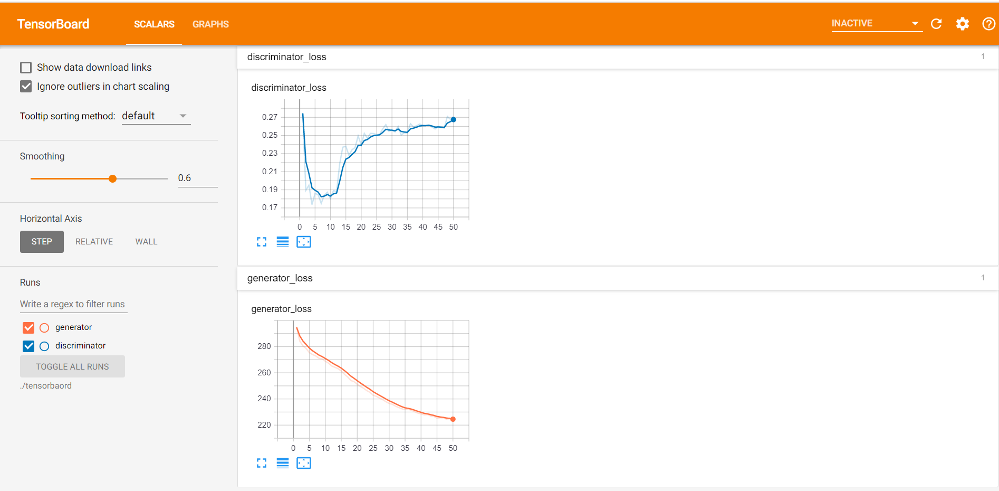

In [ ]:
# run this code in cmd prompt: "tensorboard --logdir=./tensorbaord --host=127.0.0.1"
# open "localhost:6006"  in chrome
pil_im =Image.open('tensorboard_result.png')
display.display(pil_im)

### Observation
- Discriminator loss is sum of "real + fake" loss, initially discriminator easily distinguish between real and fake, so the loss decreases, after epoch 10, when my generator somewhat learns the distribution then the loss is icreasing, and thats what we want to increase my overall discriminaton loss.

- Generator loss is decreasing all way, which shows that my generator is learning all the way, which is good.

## 8.2. Testing on Unseen Data

In [ ]:
def test_plot(g_model, sketch_img, color_img,img_name):
    '''
    Predict fake images using generator model and plot the [sketch,real,fake] image
    and further saves the figure
    
    '''
    # generating fake images
    fake_col_img = g_model.predict(sketch_img)
    
    # rescaling image [0-1]
    sketch_img = 0.5 * sketch_img + 0.5
    color_img = 0.5 * color_img + 0.5
    fake_col_img = 0.5 * fake_col_img + 0.5
    
    fig, axs = plt.subplots(sketch_img.shape[0], 3, figsize=(.8 * sketch_img.shape[0],5 * sketch_img.shape[0]))
    axs = axs.flatten()
    cnt = 0
    for sketch, real, fake in zip(sketch_img, color_img, fake_col_img):
        axs[cnt].imshow(sketch)
        axs[cnt].set_title('sketch')
        axs[cnt].axis('off')
        
        axs[cnt+1].imshow(real)
        axs[cnt+1].set_title('real_color_image')
        axs[cnt+1].axis('off')
        
        axs[cnt+2].imshow(fake)
        axs[cnt+2].set_title('fake_generated')
        axs[cnt+2].axis('off')
        cnt += 3
    fig.savefig("{}.png".format(img_name))
    plt.subplots_adjust(wspace=.1, hspace=.1)
    plt.show()

In [ ]:
# loading unseen test data 
color_img_path = glob.glob('test_set/src/*.png')
sketch_path = glob.glob('test_set/sketch/*.png')

color_img_path = np.array(color_img_path)
sketch_path = np.array(sketch_path)
total_test_img = color_img_path.shape[0]

# randomly taking 20 sketch-color pair from the test set.
index = np.random.randint(0, total_test_img, 20)

In [ ]:
def print_test(color_img_path,sketch_path,total_test_img,best_generator,index):
    '''
    Take the random sketch and real image pair and generate the corresponding fake images 
    '''
    # load best generator model
    best_g_model = load_model("save_model/generator/{}".format(best_generator))
    color_img = []
    sketch_img = []
    for sketch, image in zip(sketch_path[index], color_img_path[index]):
        # reading images
        sketch_img.append(np.array(Image.open(sketch).convert('RGB')))
        color_img.append(np.array(Image.open(image).convert('RGB')))

    # normalize [-1,1]
    sketch_img = np.array(sketch_img, dtype='float32')/127.5 - 1
    color_img = np.array(color_img, dtype='float32')/127.5 - 1
    
    # plotting the result
    test_plot(best_g_model,sketch_img,color_img, best_generator.split('.')[0])


Instructions for updating:
Call initializer instance with the dtype argument instead of passing it to the constructor
Instructions for updating:
Call initializer instance with the dtype argument instead of passing it to the constructor
Instructions for updating:
Call initializer instance with the dtype argument instead of passing it to the constructor


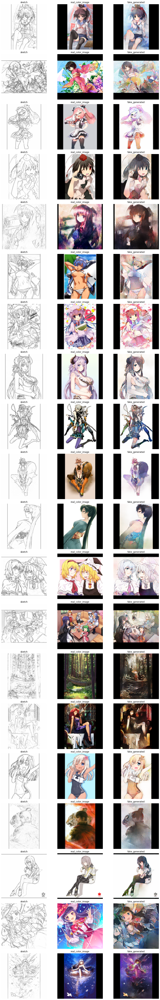

In [ ]:
#checking for generator_35
print_test(color_img_path,sketch_path,total_test_img,"generator_35.h5",index)

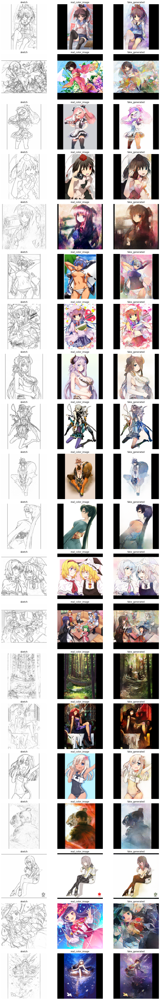

In [ ]:
#checking for generator_40
print_test(color_img_path,sketch_path,total_test_img,"generator_40.h5",index)

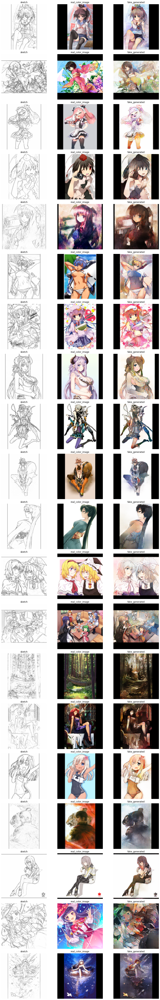

In [ ]:
#checking for generator_45
print_test(color_img_path,sketch_path,total_test_img,"generator_45.h5",index)

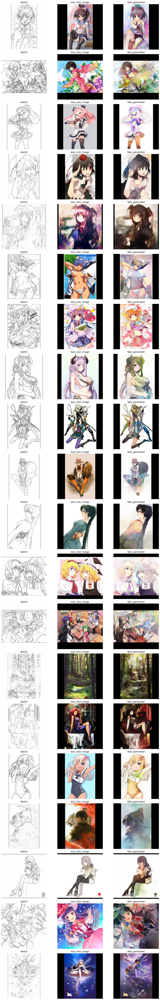

In [ ]:
#checking for generator_49
print_test(color_img_path,sketch_path,total_test_img,"generator_49.h5",index)

# Oservation:-
- considering, the low quality input image (128x128x3), the results seems well.